In [ ]:
!wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
!tar -xzf facades.tar.gz
!pip install segmentation_models_pytorch > /dev/null

--2020-12-16 10:14:49--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.189.73
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.189.73|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘facades.tar.gz’

facades.tar.gz      100%[===================>]  28.77M  2.75MB/s    in 22s     

2020-12-16 10:15:12 (1.29 MB/s) - ‘facades.tar.gz’ saved [30168306/30168306]



In [ ]:
import os
import torch
import random
import torch.nn as nn
import itertools
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from PIL import ImageFile
import matplotlib.pyplot as plt
from IPython.display import clear_output
from torchvision import datasets
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.dataloader import default_collate
import segmentation_models_pytorch as  smp
from torch import utils
from torchvision import transforms
import torch.backends.cudnn as cudnn

ImageFile.LOAD_TRUNCATED_IMAGES = True
cudnn.benchmark = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
])

dset = datasets.ImageFolder('facades/', transform)

In [ ]:
def generate_image(G, x_, y_):
    G.eval()
    test_images = G(x_.unsqueeze(0))

    size_figure_grid = 3
    fig, ax = plt.subplots(1, size_figure_grid, figsize=(10, 4))
    for j in range(size_figure_grid):
        ax[j].get_xaxis().set_visible(False)
        ax[j].get_yaxis().set_visible(False)

    ax[0].cla()
    ax[0].imshow((x_.cpu().data.numpy().transpose(1, 2, 0) + 1) / 2)
    ax[1].cla()
    ax[1].imshow((test_images[0].cpu().data.numpy().transpose(1, 2, 0) + 1) / 2)
    ax[2].cla()
    ax[2].imshow((y_.cpu().numpy().transpose(1, 2, 0) + 1) / 2)

    plt.show()

# MODELS

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(input_channels, 64, 4, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, stride=2, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img):
        return self.model(img)

In [ ]:
def Generator():
    A_Generator = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3, 
    )
    for param in A_Generator.parameters():
        param.requires_grad = True

    A_Generator.segmentation_head = nn.Sequential(
        nn.Conv2d(16, 3, 3, 1, 1),
        nn.Tanh()
    )

    return A_Generator

# PIX2PIX

In [ ]:
D = Discriminator(6).to(device)
G = Generator().to(device)
epochs = 30
batch_size = 32
lambda_L1 = 100
train_loader = DataLoader(dset, batch_size=batch_size, shuffle=True)
criterionGAN = nn.MSELoss().to(device)
L1_loss = nn.MSELoss().to(device)

G_optimizer = optim.Adam(G.parameters(), lr=2e-4)
D_optimizer = optim.Adam(D.parameters(), lr=2e-4)
# s_d = lr_scheduler.StepLR(optD, step_size=50, gamma=0.1)
# s_g = lr_scheduler.StepLR(optG, step_size=50, gamma=0.1)

EPOCH :  0 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


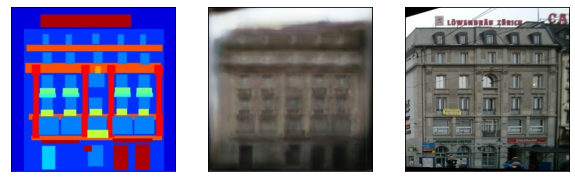

EPOCH :  1 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


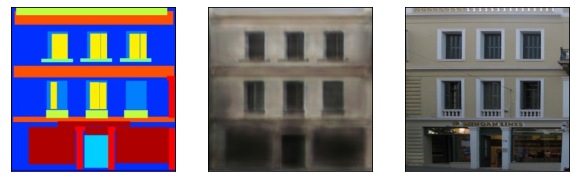

EPOCH :  2 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


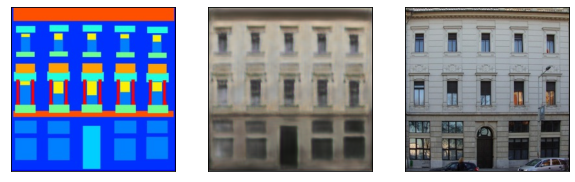

EPOCH :  3 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


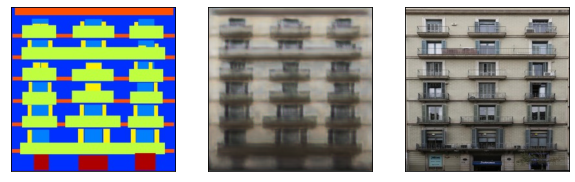

EPOCH :  4 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


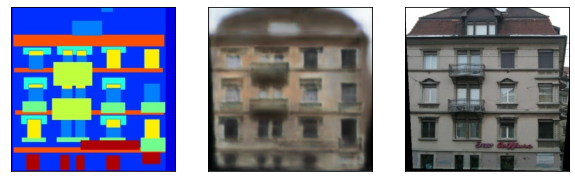

EPOCH :  5 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


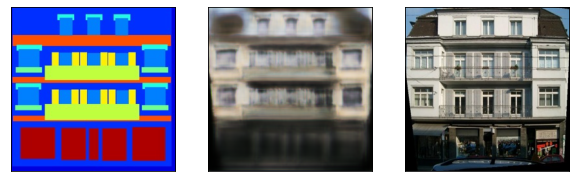

EPOCH :  6 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


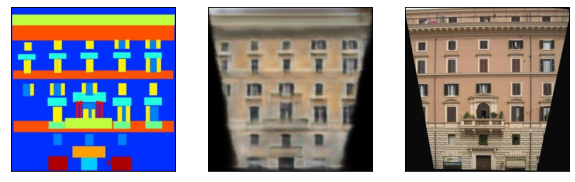

EPOCH :  7 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


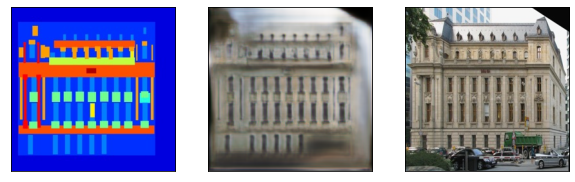

EPOCH :  8 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


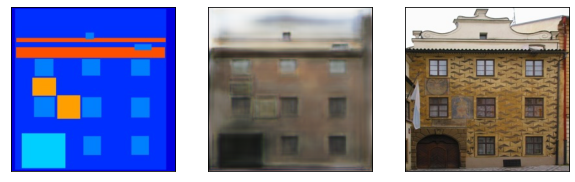

EPOCH :  9 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


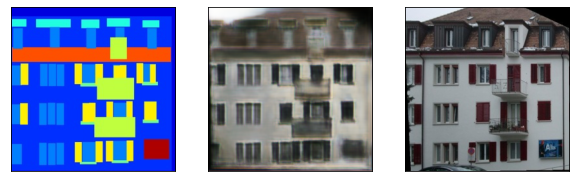

EPOCH :  10 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


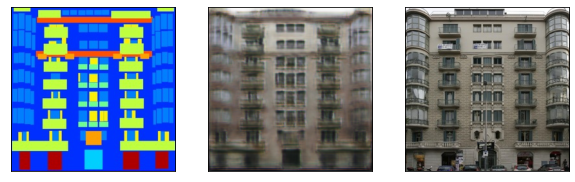

EPOCH :  11 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


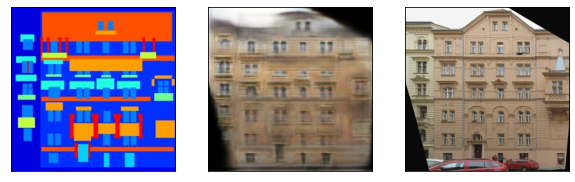

EPOCH :  12 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


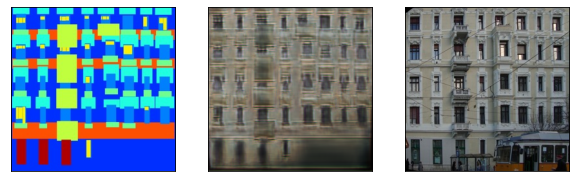

EPOCH :  13 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


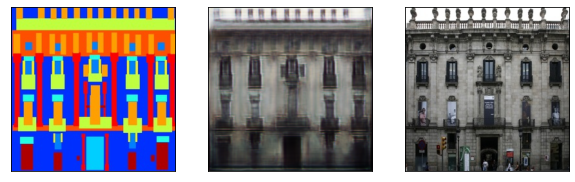

EPOCH :  14 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


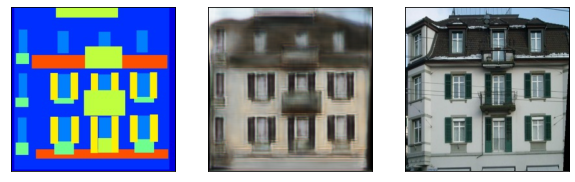

EPOCH :  15 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


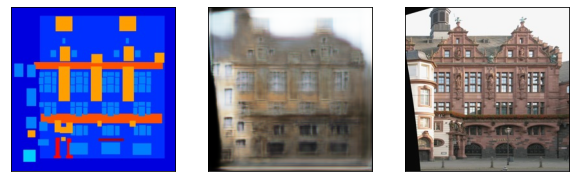

EPOCH :  16 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


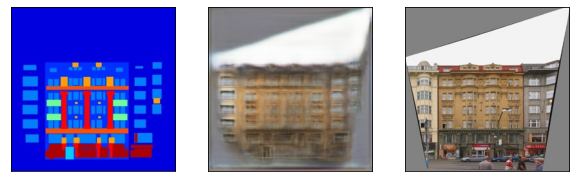

EPOCH :  17 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


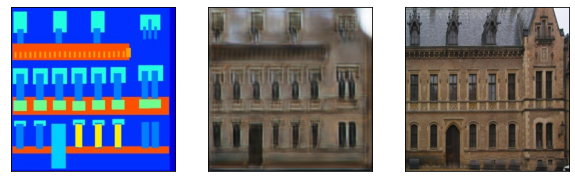

EPOCH :  18 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


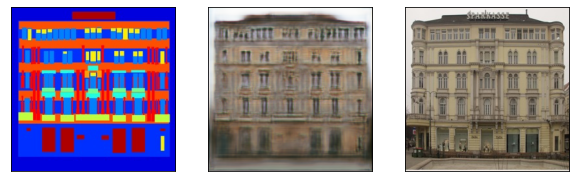

EPOCH :  19 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


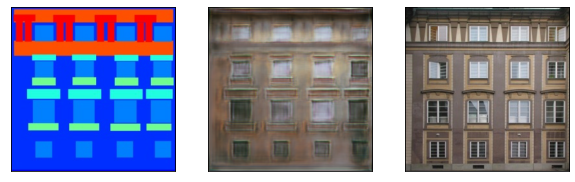

EPOCH :  20 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


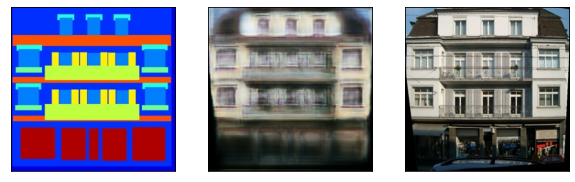

EPOCH :  21 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


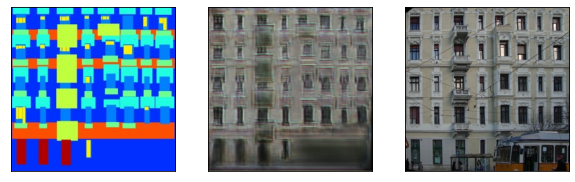

EPOCH :  22 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


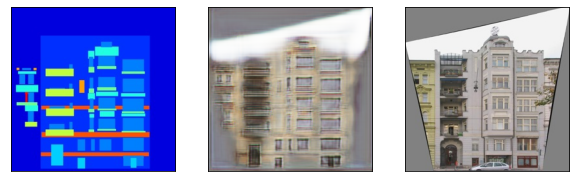

EPOCH :  23 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


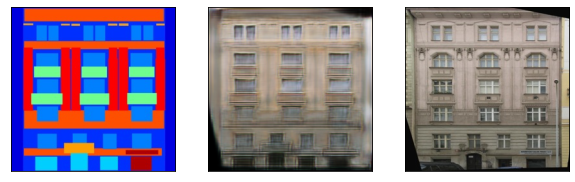

EPOCH :  24 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


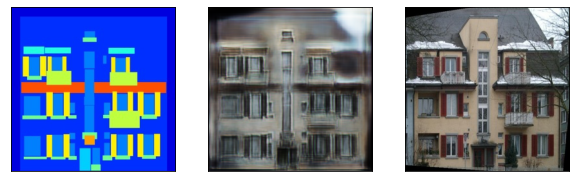

EPOCH :  25 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


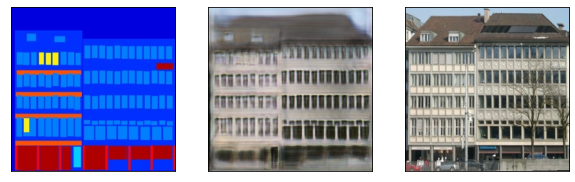

EPOCH :  26 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


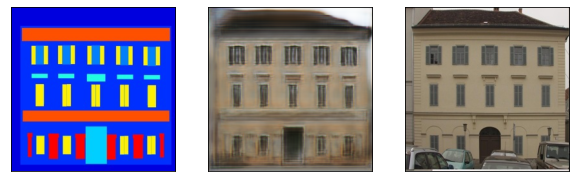

EPOCH :  27 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


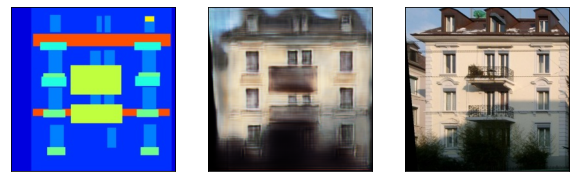

EPOCH :  28 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


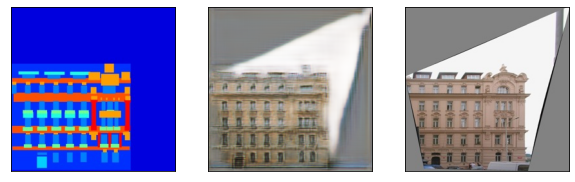

EPOCH :  29 DISC LOSS 121.24752807617188  GEN LOSS :  0.05888935178518295


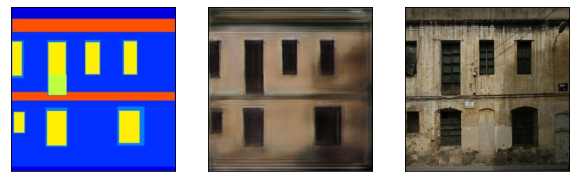

In [ ]:
G.train()
D.train()
D_losses = []
G_losses = []
for e in range(epochs):
    step = 0
    for img, _ in train_loader:
        real_A = img[:, :, :, 256:].to(device)
        real_B = img[:, :, :, :256].to(device)
        
        D.train()
        fake_B = G(real_A)

        # optimize discriminant with True and False examples
        D_optimizer.zero_grad()
        fake_AB = torch.cat((real_A, fake_B), 1)
        pred_fake = D(fake_AB.detach())
        loss_fake = criterionGAN(pred_fake, torch.zeros(pred_fake.shape[0], 1, 16, 16).to(device))
        real_AB = torch.cat((real_A, real_B), 1)
        pred_real = D(real_AB)
        loss_real = criterionGAN(pred_real, torch.ones(pred_real.shape[0], 1, 16, 16).to(device))
        loss_D = (loss_fake + loss_real) * 0.5
        loss_D.backward()

        D_optimizer.step()

        D_losses.append(loss_D.item())
        D.eval()
        G_optimizer.zero_grad()
        # optimize generator with True(L1 loss) + gan loss (log(D(X))) 
        fake_AB = torch.cat((real_A, fake_B), 1)
        pred_fake = D(fake_AB)
        loss_GAN = criterionGAN(pred_fake, torch.ones(pred_fake.shape[0], 1, 16, 16).to(device))
        loss_L1 = L1_loss(fake_B, real_B) * lambda_L1
        loss_G = loss_GAN + loss_L1
        loss_G.backward()
        G_optimizer.step()

        G_losses.append(loss_G.item())

    print('EPOCH : ', e, 'DISC LOSS', D_losses[-1], ' GEN LOSS : ', G_losses[-1])
    generate_image(G, real_A[0], real_B[0])

# CycleGAN

In [ ]:
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

G_A = Generator().to(device)
G_B = Generator().to(device)

In [ ]:
epochs = 15
batch_size = 16
lambda_idt = 0.5
lambda_A = 10
lambda_B = 10
train_loader = DataLoader(dset, batch_size=batch_size, shuffle=True)
criterionGAN = nn.MSELoss().to(device)
criterionCycle = torch.nn.L1Loss().to(device)
criterionIdt = torch.nn.L1Loss().to(device)

G_optimizer = optim.Adam(list(G_A.parameters()) + list(G_B.parameters()), betas=(0.5, 0.999), lr=1e-4)
D_optimizer = optim.Adam(list(D_A.parameters()) + list(D_B.parameters()), betas=(0.5, 0.999), lr=1e-4)

In [ ]:
class ReplayBuffer():
    def __init__(self, max_size=50):
        self.max_size = max_size
        self.data = []

    def get(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.random() > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

EPOCH :  0 G LOSS 5.876583099365234  D LOSS :  0.04538367036730051
A --> B


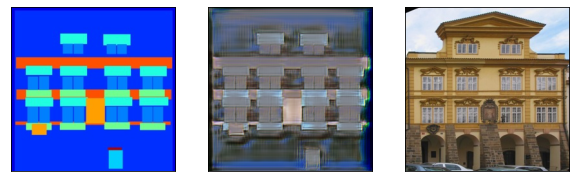

B --> A


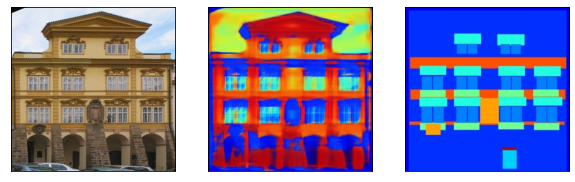

EPOCH :  1 G LOSS 5.162095069885254  D LOSS :  0.0571524053812027
A --> B


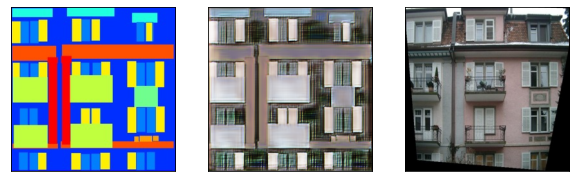

B --> A


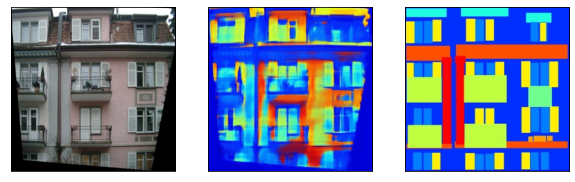

EPOCH :  2 G LOSS 5.106017112731934  D LOSS :  0.03793018404394388
A --> B


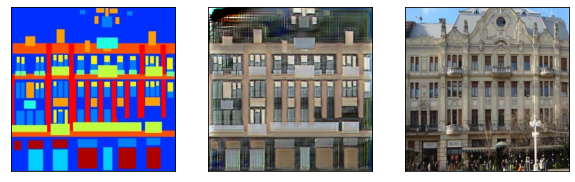

B --> A


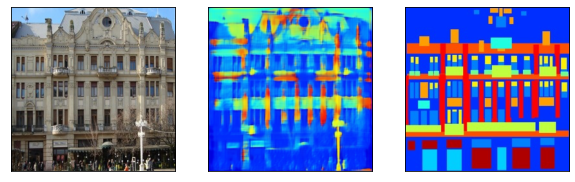

EPOCH :  3 G LOSS 4.171745300292969  D LOSS :  0.0781813059002161
A --> B


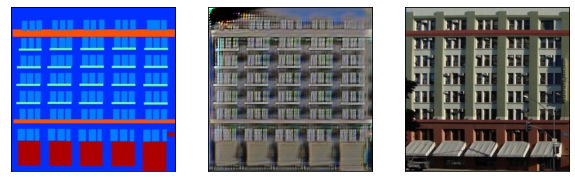

B --> A


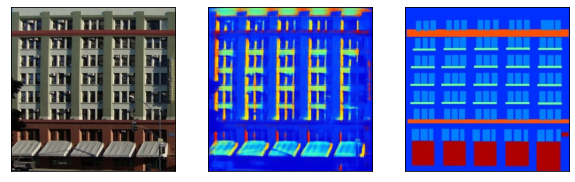

EPOCH :  4 G LOSS 4.451753616333008  D LOSS :  0.06397387385368347
A --> B


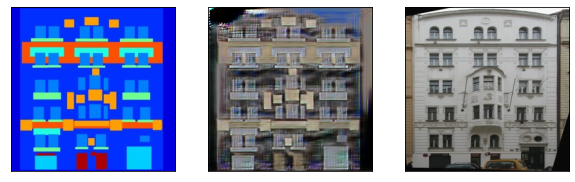

B --> A


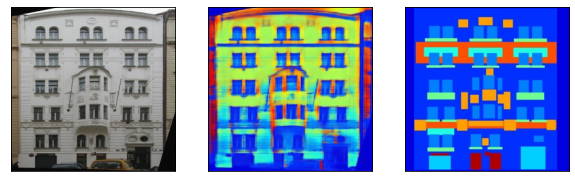

EPOCH :  5 G LOSS 4.069511413574219  D LOSS :  0.09231595974415541
A --> B


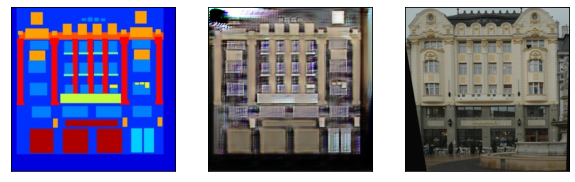

B --> A


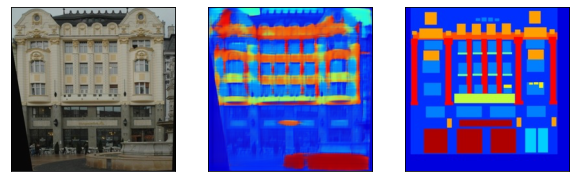

EPOCH :  6 G LOSS 3.791712999343872  D LOSS :  0.05438964255154133
A --> B


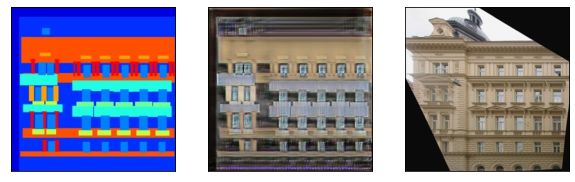

B --> A


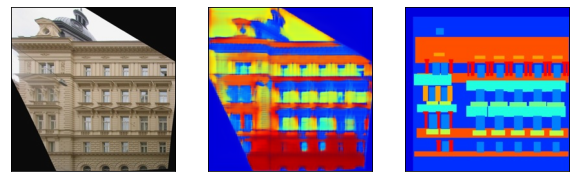

EPOCH :  7 G LOSS 3.855355739593506  D LOSS :  0.07715249434113503
A --> B


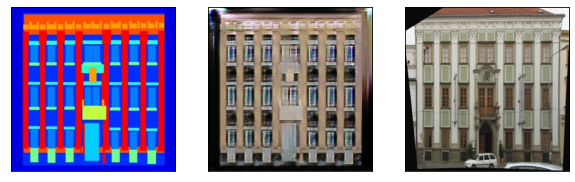

B --> A


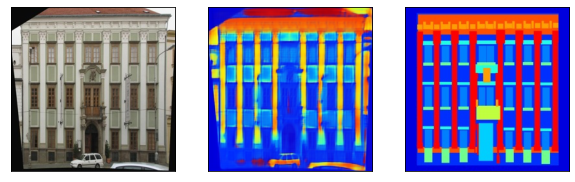

EPOCH :  8 G LOSS 3.937912702560425  D LOSS :  0.07956744637340307
A --> B


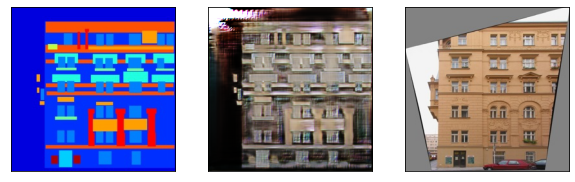

B --> A


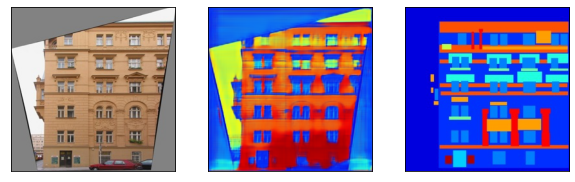

EPOCH :  9 G LOSS 4.139835357666016  D LOSS :  0.16239263582974672
A --> B


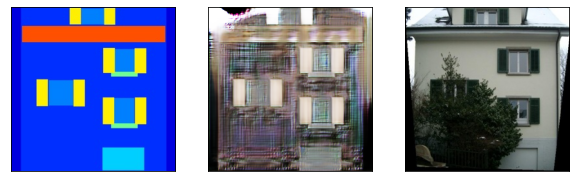

B --> A


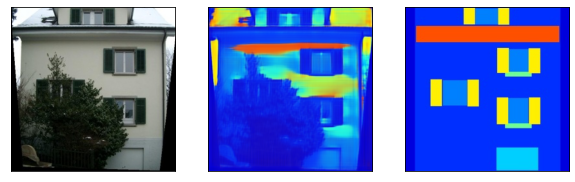

EPOCH :  10 G LOSS 3.518002510070801  D LOSS :  0.10382140800356865
A --> B


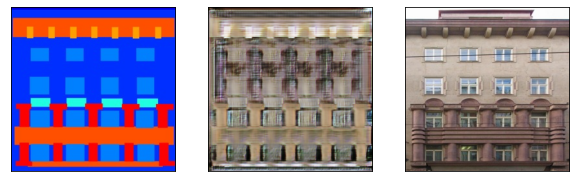

B --> A


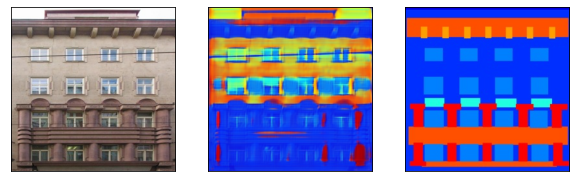

EPOCH :  11 G LOSS 5.206357955932617  D LOSS :  0.0778031088411808
A --> B


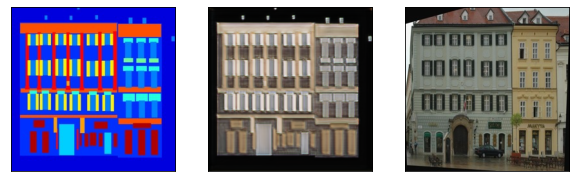

B --> A


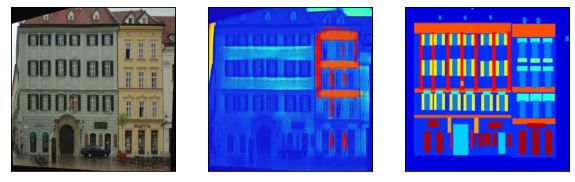

EPOCH :  12 G LOSS 3.6230223178863525  D LOSS :  0.08782264776527882
A --> B


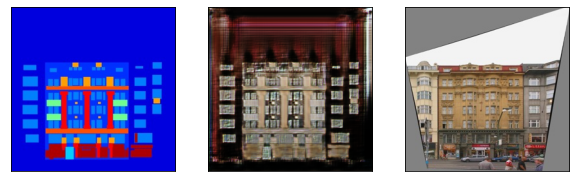

B --> A


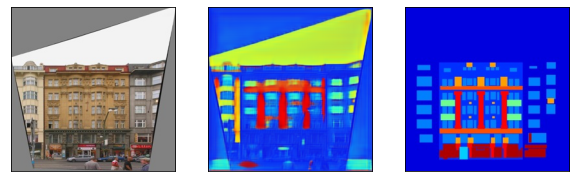

EPOCH :  13 G LOSS 3.7564358711242676  D LOSS :  0.07136819511651993
A --> B


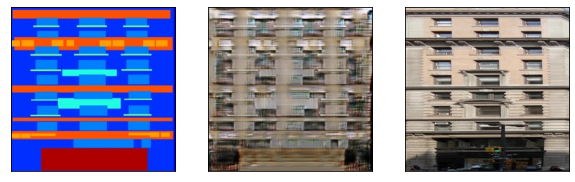

B --> A


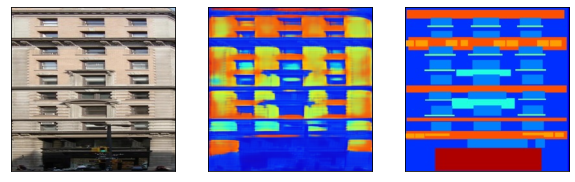

EPOCH :  14 G LOSS 3.762958288192749  D LOSS :  0.07331555616110563
A --> B


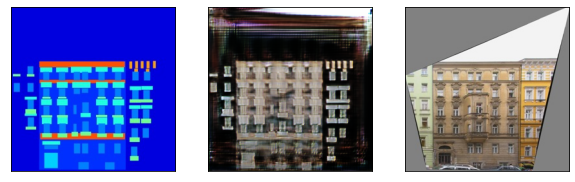

B --> A


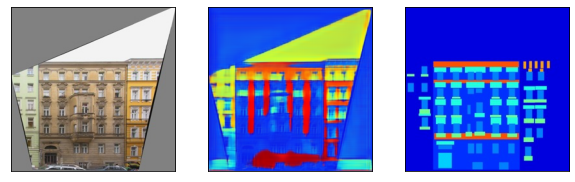

In [ ]:
G_A.train()
G_B.train()
D_A.train()
D_B.train()
G_losses = []
D_losses = []
fake_B_pool = ReplayBuffer()
fake_A_pool = ReplayBuffer()

for e in range(epochs):
    step = 0
    for img, _ in train_loader:
        real_A = img[:, :, :, 256:].to(device)
        real_B = img[:, :, :, :256].to(device)
        
        fake_B = G_A(real_A)
        recovered_A = G_B(fake_B)
        fake_A = G_B(real_B)
        recovered_B = G_A(fake_A)
        D_B.eval()
        D_A.eval()

        #optimize Generators
        G_optimizer.zero_grad()
        
        #identity loss (is generated similar with condition)
        idt_A = G_A(real_B)
        loss_idt_A = criterionIdt(idt_A, real_B) * lambda_B * lambda_idt

        idt_B = G_B(real_A)
        loss_idt_B = criterionIdt(idt_B, real_A) * lambda_A * lambda_idt
        #gan losses for A and B
        loss_A = criterionGAN(D_A(fake_B), torch.ones(fake_A.shape[0], 1, 16, 16).to(device))

        loss_B = criterionGAN(D_B(fake_A), torch.ones(fake_A.shape[0], 1, 16, 16).to(device))
        #cycle loss L1(G_A(G_B(x)), x) and L1(G_B(G_A(y)), y)
        loss_cycle_A = criterionCycle(recovered_A, real_A) * lambda_A
        loss_cycle_B = criterionCycle(recovered_B, real_B) * lambda_B

        loss_G = loss_A + loss_B + loss_cycle_A + loss_cycle_B + loss_idt_A + loss_idt_B
        loss_G.backward()
        G_losses.append(loss_G.item())
        G_optimizer.step()

        D_B.train()
        D_A.train()

        #optimize Discriminator
        D_optimizer.zero_grad()

        fake_B = fake_B_pool.get(fake_B)
        pred_real = D_A(real_B)
        loss_real = criterionGAN(pred_real, torch.ones(pred_real.shape[0], 1, 16, 16).to(device))
        pred_fake = D_A(fake_B.detach())
        loss_fake = criterionGAN(pred_fake, torch.zeros(pred_real.shape[0], 1, 16, 16).to(device))
        loss_D = (loss_real + loss_fake) * 0.5
        loss_D.backward()
        D_losses.append(loss_D.item())

        fake_A = fake_A_pool.get(fake_A)
        pred_real = D_B(real_A)
        loss_real = criterionGAN(pred_real, torch.ones(pred_real.shape[0], 1, 16, 16).to(device))
        pred_fake = D_B(fake_A.detach())
        loss_fake = criterionGAN(pred_fake, torch.zeros(pred_real.shape[0], 1, 16, 16).to(device))
        loss_D = (loss_real + loss_fake) * 0.5
        loss_D.backward()
        D_losses[-1] += loss_D.item()
        D_optimizer.step()

    print('EPOCH : ', e, 'G LOSS', G_losses[-1], ' D LOSS : ', D_losses[-1])
    print('A --> B')
    generate_image(G_A, real_A[1], real_B[1])
    print('B --> A')
    generate_image(G_B, real_B[1], real_A[1])